In [1]:
!pip install tensorflow_addons


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 23.0 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as keras
import keras.layers as layers
from sklearn.model_selection import train_test_split
import random
import tensorflow_probability as tfp
import tensorflow_addons as tfa

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [3]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Conv2D, Flatten, Dense, Conv2DTranspose, Reshape, Lambda, Activation, BatchNormalization, LeakyReLU, Dropout, MaxPooling2D, UpSampling2D, Concatenate
from keras.models import Model
from keras import backend as K
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
from keras.utils import plot_model
import gc

In [4]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.filters import threshold_otsu
from glob import glob
from scipy import misc
from matplotlib.patches import Circle,Ellipse
from matplotlib.patches import Rectangle

In [5]:
import os
from PIL import Image
import scipy.misc
import imageio
from skimage.transform import rescale, resize
from skimage.color import lab2rgb

In [6]:
from matplotlib import pyplot as plt
import numpy as np
import gzip

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
ab_path = '/content/drive/MyDrive/archive (5)/ab/ab/ab1.npy'
l_path = '/content/drive/MyDrive/archive (5)/l/gray_scale.npy'

In [9]:
ab_df = np.load(ab_path)[0:3000]
L_df = np.load(l_path)[0:3000]
dataset = (L_df,ab_df )
gc.collect()

22

In [10]:
def lab_to_rgb(L, ab):
    """
    Takes an image or a batch of images and converts from LAB space to RGB
    """
    L = L  * 100
    ab = (ab - 0.5) * 128 * 2
    Lab = np.concatenate([L, ab], dim=2).numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = Image.lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

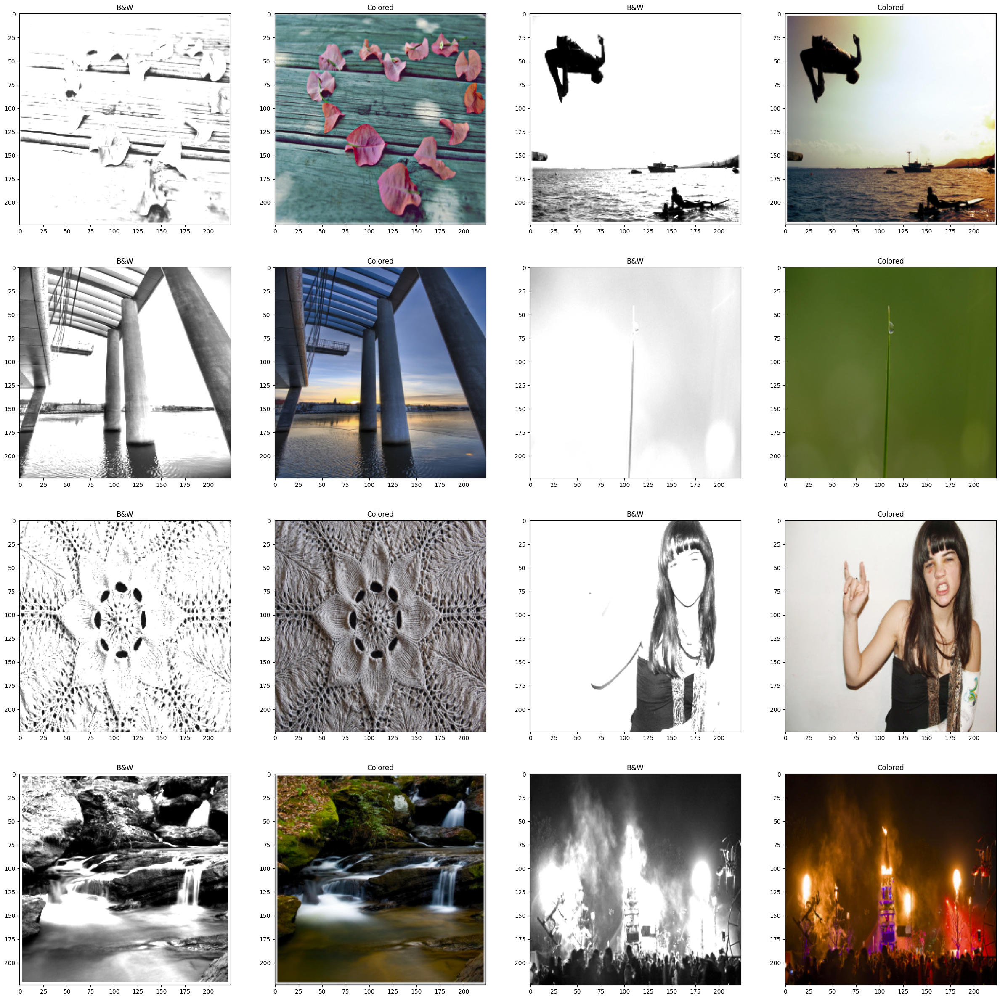

In [11]:
plt.figure(figsize=(30,30))
for i in range(1,16,2):
    plt.subplot(4,4,i)
    img = np.zeros((224,224,3))
    img[:,:,0] = L_df[i]
    plt.title('B&W')
    plt.imshow(lab2rgb(img))

    plt.subplot(4,4,i+1)
    img[:,:,1:] = ab_df[i]
    img = img.astype('uint8')
    img = cv2.cvtColor(img, cv2.COLOR_LAB2RGB)
    plt.title('Colored')
    plt.imshow(img)

In [12]:
img_size = 224
batch_size = 64
INPUT_DIM = (img_size,img_size,1)
Z_DIM = 64

In [13]:
ab_df.shape

(3000, 224, 224, 2)

In [14]:
x = x = (L_df/255).astype('float32')
y = (ab_df/255).astype('float32')

In [15]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

train_x, test_x, train_y, test_y = train_test_split( x , y , test_size=0.1, random_state=42 )

In [16]:
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        mean_mu, log_var = inputs
        epsilon = tf.random.normal(shape=tf.shape(mean_mu), mean=0., stddev=1.)
        return mean_mu + tf.math.exp(log_var/2)*epsilon

In [17]:
lrelu = tf.nn.selu

In [18]:
def build_vae_encoder(input_dim, output_dim):

    # Clear tensorflow session to reset layer index numbers to 0 for LeakyRelu,
    # BatchNormalization and Dropout.
    # Otherwise, the names of above mentioned layers in the model
    # would be inconsistent
    global K
    K.clear_session()


    # Define model input
    encoder_input = Input(shape = input_dim, name = 'encoder_input')
    x = encoder_input

    # Add convolutional layers
    conv1 = Conv2D( 8 , kernel_size=( 5 , 5 ) , strides=1 )( x )
    conv1 = LeakyReLU()( conv1 )
    conv1 = Conv2D( 16 , kernel_size=( 3 , 3 ) , strides=1)( conv1 )
    conv1 = LeakyReLU()( conv1 )
    conv1 = Conv2D( 16 , kernel_size=( 3 , 3 ) , strides=1)( conv1 )
    conv1 = LeakyReLU()( conv1 )

    conv2 = Conv2D( 16 , kernel_size=( 5 , 5 ) , strides=1)( conv1 )
    conv2 = LeakyReLU()( conv2 )
    conv2 = Conv2D( 32 , kernel_size=( 3 , 3 ) , strides=1 )( conv2 )
    conv2 = LeakyReLU()( conv2 )
    conv2 = Conv2D( 32 , kernel_size=( 3 , 3 ) , strides=1 )( conv2 )
    conv2 = LeakyReLU()( conv2 )

    conv3 = Conv2D( 32 , kernel_size=( 5 , 5 ) , strides=1 )( conv2 )
    conv3 = LeakyReLU()( conv3 )
    conv3 = Conv2D( 64 , kernel_size=( 3 , 3 ) , strides=1 )( conv3 )
    conv3 = LeakyReLU()( conv3 )
    conv3 = Conv2D( 64 , kernel_size=( 3 , 3 ) , strides=1 )( conv3 )
    conv3 = LeakyReLU()( conv3 )

    # Required for reshaping latent vector while building Decoder
    shape_before_flattening = K.int_shape(conv3)[1:]

    x = Flatten()(conv3)

    mean_mu = Dense(64, name = 'mu')(x)
    log_var = Dense(64, name = 'log_var')(x)

    # Using a Keras Lambda Layer to include the sampling function as a layer
    # in the model
    z = Sampling()([mean_mu, log_var])
    cshape1 = tf.shape(conv1)[2]
    cshape2 = tf.shape(conv2)[2]
    cshape3 = tf.shape(conv3)[2]

    return encoder_input, [z, conv3, conv2, conv1], [cshape1, cshape2, cshape3], mean_mu, log_var , shape_before_flattening, Model(inputs = encoder_input, outputs = [mean_mu, log_var, z, conv3, conv2, conv1])

In [19]:
vae_encoder_input, vae_encoder_output, cshape, mean_mu, log_var, vae_shape_before_flattening, encoder  = build_vae_encoder(input_dim = INPUT_DIM,
                                    output_dim = Z_DIM)

encoder.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 encoder_input (InputLayer)     [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 220, 220, 8)  208         ['encoder_input[0][0]']          
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 220, 220, 8)  0           ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 218, 218, 16  1168        ['leaky_re_lu[0][0]']        

In [20]:
def build_decoder(input_dim, shape_before_flattening):


    decoder_input = Input(shape = (input_dim,) , name = 'decoder_input')
    conv3 = Input(shape = (200,200,64,) , name = 'conv3')
    conv2 = Input(shape = (208,208,32,) , name = 'conv2')
    conv1 = Input(shape = (216,216,16,) , name = 'conv1')


    x = Dense(np.prod(shape_before_flattening))(decoder_input)
    x = Reshape(shape_before_flattening)(x)

 
    concat_1 = Concatenate()( [ x , conv3 ] )
    conv_up_3 = Conv2DTranspose( 64 , kernel_size=( 3 , 3 ) , strides=1 )( concat_1 )
    conv_up_3 = LeakyReLU()( conv_up_3 )
    conv_up_3 = Conv2DTranspose( 64 , kernel_size=( 3 , 3 ) , strides=1 )( conv_up_3 )
    conv_up_3 = LeakyReLU()( conv_up_3 )
    conv_up_3 = Conv2DTranspose( 32 , kernel_size=( 5 , 5 ) , strides=1 )( conv_up_3 )
    conv_up_3 = LeakyReLU()( conv_up_3 )

    concat_2 = Concatenate()( [ conv_up_3 , conv2 ] )
    conv_up_2 = Conv2DTranspose( 32 , kernel_size=( 3 , 3 ) , strides=1 )( concat_2 )
    conv_up_2 = LeakyReLU()( conv_up_2 )
    conv_up_2 = Conv2DTranspose( 16 , kernel_size=( 3 , 3 ) , strides=1 )( conv_up_2 )
    conv_up_2 = LeakyReLU()( conv_up_2 )
    conv_up_2 = Conv2DTranspose( 16 , kernel_size=( 5 , 5 ) , strides=1 )( conv_up_2 )
    conv_up_2 = LeakyReLU()( conv_up_2 )

    concat_3 = Concatenate()( [ conv_up_2 , conv1 ] )
    conv_up_1 = Conv2DTranspose( 16 , kernel_size=( 3 , 3 ) , strides=1 )( concat_3 )
    conv_up_1 = LeakyReLU()( conv_up_1 )
    conv_up_1 = Conv2DTranspose( 8 , kernel_size=( 3 , 3 ) , strides=1 )( conv_up_1 )
    conv_up_1 = LeakyReLU()( conv_up_1 )
    x = Conv2DTranspose( 2 , kernel_size=( 5 , 5 ) , strides=1 , activation='relu')( conv_up_1 )

    
    decoder_output = x

    return [decoder_input, conv3, conv2, conv1], decoder_output, Model(inputs = [decoder_input, conv3, conv2, conv1], outputs = decoder_output)

In [21]:
vae_decoder_input, vae_decoder_output, decoder = build_decoder(input_dim = Z_DIM,
                                        shape_before_flattening = vae_shape_before_flattening
                                        )
decoder.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 decoder_input (InputLayer)     [(None, 64)]         0           []                               
                                                                                                  
 dense (Dense)                  (None, 2560000)      166400000   ['decoder_input[0][0]']          
                                                                                                  
 reshape (Reshape)              (None, 200, 200, 64  0           ['dense[0][0]']                  
                                )                                                                 
                                                                                                  
 conv3 (InputLayer)             [(None, 200, 200, 6  0           []                         

In [22]:
lr = 0.00005

In [23]:
def r_accuracy(img_original, img_reconstructed):
    mse = tf.reduce_mean((img_original - img_reconstructed) ** 2)
    pixel_max = 1.0
    psnr = 20 * tf.math.log(pixel_max / tf.math.sqrt(mse))/tf.math.log(10.0)
    return psnr

In [24]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        self.r_accuracy_tracker = keras.metrics.Mean(name="r_accuracy")
        self.r_accuracy = r_accuracy


    def call(self,x):
        z_mean, z_log_var, z, conv3, conv2, conv1 = self.encoder(x)
        reconstruction = self.decoder([z, conv3, conv2, conv1])
        return reconstruction


    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
            self.r_accuracy_tracker,
        ]

    def train_step(self, data):
        x, y = data
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z, conv3, conv2, conv1 = self.encoder(x)
            reconstruction = self.decoder([z, conv3, conv2, conv1])
            reconstruction_loss = tf.reduce_mean(tf.math.square(y - reconstruction), axis=[1, 2, 3])
            kl_loss = -0.5 * tf.reduce_sum(1 + z_log_var - tf.math.square(z_mean) - tf.math.exp(z_log_var), axis = 1)
            kl_loss = tf.reduce_mean(kl_loss)
            
            total_loss = 10000*reconstruction_loss + kl_loss
            r_accuracy = self.r_accuracy(y, reconstruction)

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        self.r_accuracy_tracker.update_state(r_accuracy)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
            "r_accuracy": self.r_accuracy_tracker.result(),
        }

In [25]:
model1 = VAE(encoder,decoder)
model1.compile(optimizer=keras.optimizers.Adam(learning_rate = lr))

In [26]:
history = model1.fit(train_x, train_y, epochs=600, batch_size=16, verbose=1)

Epoch 1/600
169/169 [==============================] - 52s 170ms/step - loss: 1230.3421 - reconstruction_loss: 0.0652 - kl_loss: 31.6814 - r_accuracy: 12.9486
Epoch 2/600
169/169 [==============================] - 26s 155ms/step - loss: 302.3051 - reconstruction_loss: 0.0249 - kl_loss: 20.7751 - r_accuracy: 16.1015
Epoch 3/600
169/169 [==============================] - 26s 154ms/step - loss: 201.8257 - reconstruction_loss: 0.0175 - kl_loss: 12.9114 - r_accuracy: 17.6088
Epoch 4/600
169/169 [==============================] - 26s 154ms/step - loss: 153.2056 - reconstruction_loss: 0.0133 - kl_loss: 11.9758 - r_accuracy: 18.8008
Epoch 5/600
169/169 [==============================] - 26s 154ms/step - loss: 122.6390 - reconstruction_loss: 0.0107 - kl_loss: 11.2208 - r_accuracy: 19.7706
Epoch 6/600
169/169 [==============================] - 26s 154ms/step - loss: 103.6431 - reconstruction_loss: 0.0091 - kl_loss: 10.3020 - r_accuracy: 20.4570
Epoch 7/600
169/169 [==============================

In [27]:
pred = model1.predict(test_x)

10/10 [==============================] - 3s 69ms/step


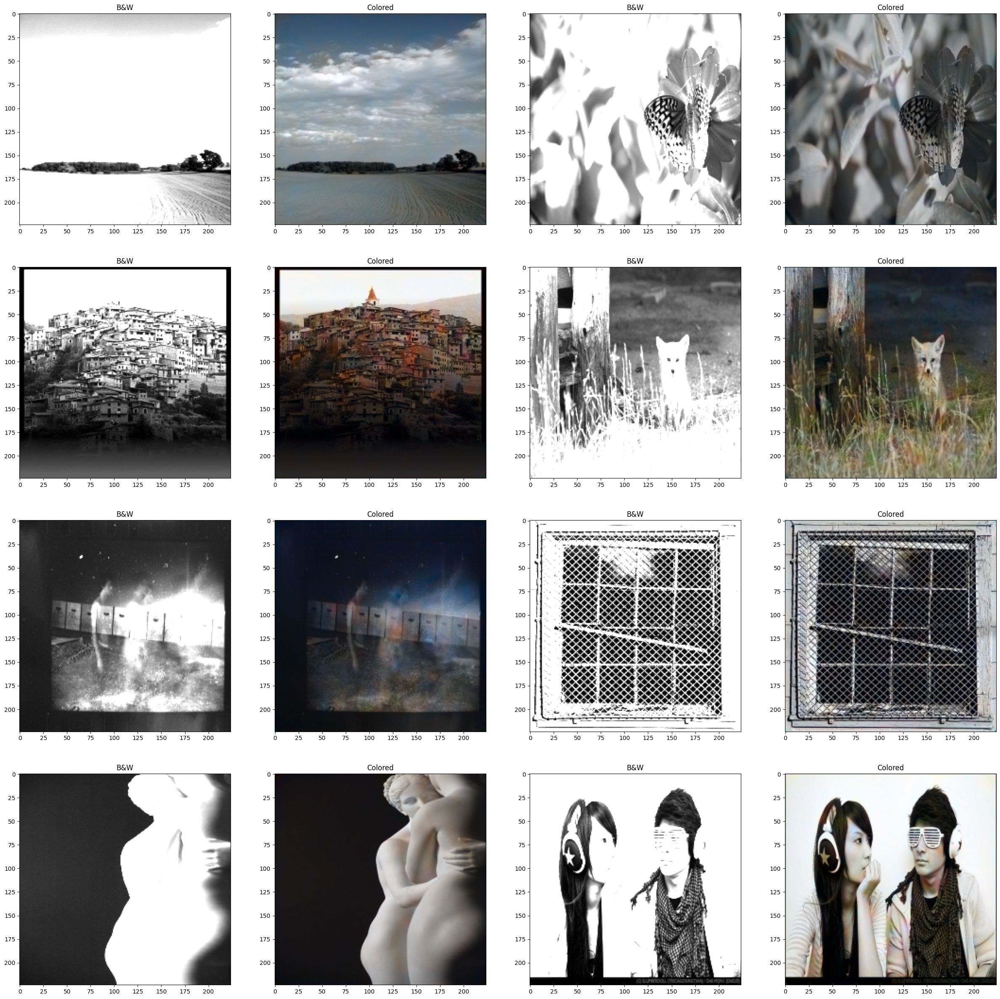

In [28]:
plt.figure(figsize=(30,30))
for i in range(1,16,2):
    plt.subplot(4,4,i)
    img = np.zeros((224,224,3))
    img[:,:,0] = test_x[i]*255
    plt.title('B&W')
    plt.imshow(lab2rgb(img))

    plt.subplot(4,4,i+1)
    img[:,:,1:] = pred[i]*255
    img = img.astype('uint8')
    img = cv2.cvtColor(img, cv2.COLOR_LAB2RGB)
    plt.title('Colored')
    plt.imshow(img)

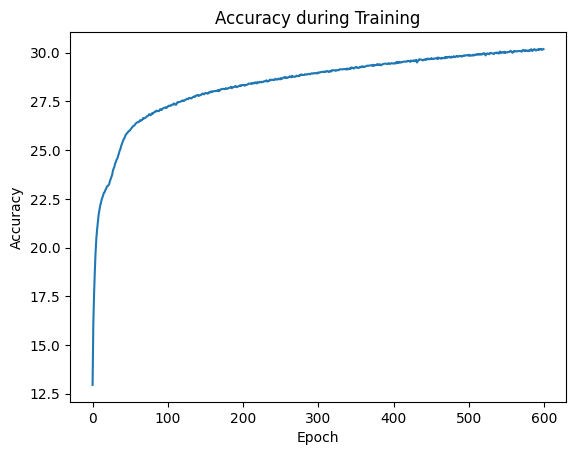

In [29]:
plt.plot(history.history['r_accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy during Training')
plt.show()

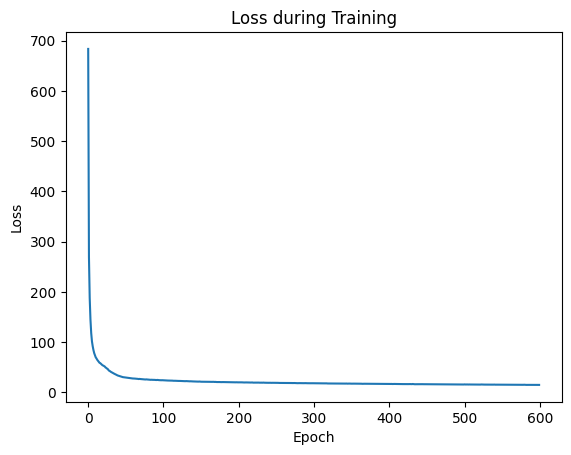

In [31]:
plt.plot(history.history['loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss during Training')
plt.show()

In [33]:
accuracy = history.history['r_accuracy']
loss = history.history['loss']
reconstruction_loss = history.history['reconstruction_loss']

# Plot the metrics
epochs = range(1, len(accuracy) + 1)

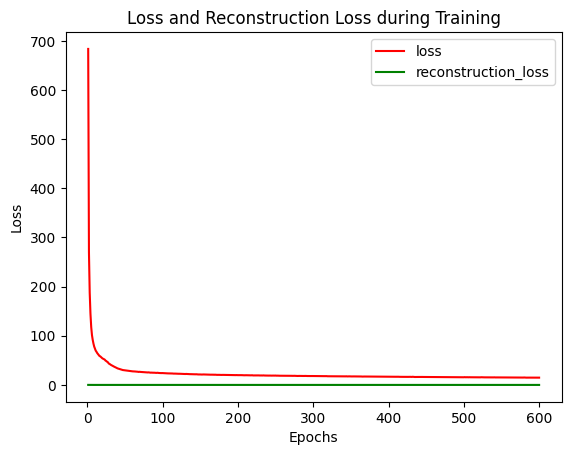

In [34]:
plt.plot(epochs, loss, 'r', label='loss')
plt.plot(epochs, reconstruction_loss, 'g', label='reconstruction_loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss and Reconstruction Loss during Training')
plt.legend()
plt.show()